# МОМО, II семестр. Домашнее задание №1

## 1) Импорт библиотек

In [1]:
import pandas as pd # Библиотека Pandas для работы с табличными данными
import numpy as np # библиотека Numpy для операций линейной алгебры и прочего
import matplotlib.pyplot as plt # библиотека Matplotlib для визуализации
import seaborn as sns # библиотека seaborn для визуализации
import plotly.graph_objects as go # Библиотека Plotly. Модуль "Graph Objects"

from sklearn.tree import DecisionTreeRegressor # Деревья Решений для Регрессии от scikit-learn
import dtreeviz # Пакет для визуализации дерева решений

from sklearn.model_selection import train_test_split#  функция разбиения на тренировочную и тестовую выборку
from sklearn.model_selection import ShuffleSplit # при кросс-валидации случайно перемешиваем данные
from sklearn.model_selection import cross_validate # функция кросс-валидации от Scikit-learn
from sklearn.model_selection import GridSearchCV # функция для поиска наилучших параметров по сетке

from sklearn.preprocessing import PowerTransformer  # Степенное преобразование от scikit-learn
from sklearn.preprocessing import PolynomialFeatures # Создание полимиальных признаков

from sklearn.metrics import mean_squared_error as mse # метрика MSE от Scikit-learn
from sklearn.metrics import r2_score # коэффициент детерминации  от Scikit-learn

from sklearn.metrics import PredictionErrorDisplay # Класс визуализации ошибок модели
from sklearn.compose import TransformedTargetRegressor # Для оценки влияния предобработки таргера

import logging
logging.getLogger('matplotlib').setLevel(logging.ERROR) # Чтобы на нас не ругались из-за того что matplot.lib проломали шрифты

import warnings
warnings.filterwarnings('ignore')

## 2) Набор данных

Набор данных представляет собой объявления о продажах автомобилей на вторичном рынке в Москве за 2020 год. Данные предоставлены с сайта auto.ru и взяты с платформы kaggle.
Данные содержат следующие колонки:

**Model** = Модель автомобиля\
**Year** = Год производства\
**Mileage** = Пробег, км\
**V_engine** = Объем двигателя, л\
**EngineType** = Тип топлива используемый двигателем\
**HorsePower** = Мощность двигателя, л.с.\
**Tax** = Сумма налога на ТС\
**State** = Состояние автомобиля\
**Owners** = Количество владельцев\
**Passport** = Оригинал или дубликат ПТС\
**Customs** = Таможенная очистка\
**Selector** = Тип трансмиссии\
**Color** = Цвет\
**CarBodyType** = Тип кузова\
**Accidents** = Количество ДТП\
**Drive** = Тип привода\
**Price** = Цена\

## 3) Предварительная обработка данных.
Предварительная обработка данных выполнена в рамках [Домашнего задания №1, I семестр](https://apps.skillfactory.ru/learning/course/course-v1:Skillfactory+URFUML2023+SEP2023/block-v1:Skillfactory+URFUML2023+SEP2023+type@sequential+block@4d952a3ad913418eb1e71373aa4c54a9/block-v1:Skillfactory+URFUML2023+SEP2023+type@vertical+block@de98e0c578044022badc0747bd026709?homework=4233) \
Загрузим уже обработанные данные:


In [2]:
df = pd.read_csv('autoru_final.csv')

In [3]:
df.sample(3)

,Unnamed: 0,V_engine,Mileage,Year,HorsePower,Price,Owners,Passport,EngineType_ Бензин,"EngineType_ Бензин, газобаллонное оборудование",...,Manufacturer_Nissan,Manufacturer_Opel,Manufacturer_Porsche,Manufacturer_Renault,Manufacturer_SEAT,Manufacturer_Skoda,Manufacturer_Subaru,Manufacturer_Suzuki,Manufacturer_Toyota,Manufacturer_Volkswagen
19803,19803,-0.250464,0.109999,0.233369,-0.268413,800000.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4176,4176,-0.250464,0.081999,0.233369,-0.068945,1160000.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8345,8345,-0.788421,0.285999,-0.905346,-1.564775,65000.0,2.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
# удалим незначащий индексный столбец
df = df.drop(['Unnamed: 0'], axis=1)

In [5]:
df.sample(3)

,V_engine,Mileage,Year,HorsePower,Price,Owners,Passport,EngineType_ Бензин,"EngineType_ Бензин, газобаллонное оборудование",EngineType_ Газ,...,Manufacturer_Nissan,Manufacturer_Opel,Manufacturer_Porsche,Manufacturer_Renault,Manufacturer_SEAT,Manufacturer_Skoda,Manufacturer_Subaru,Manufacturer_Suzuki,Manufacturer_Toyota,Manufacturer_Volkswagen
3708,-0.68083,0.063295,0.970140,-0.514865,1237000.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
33404,0.07231,0.151499,-0.753564,1.200243,335000.0,2.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23958,0.82545,0.212999,0.411342,0.405085,1750000.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 4) Построение модели машинного обучения (дерево решение)

Разбиваем данные на тренировочную и тестовую выборки:

In [6]:
# Создаем таргет и удаляем таргет из датасета
X, y = df.drop(columns = ['Price']), df['Price']

In [7]:
# Разбиваем выборки на тестовую и тренировочную
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [8]:
X_train.head(3)

,V_engine,Mileage,Year,HorsePower,Owners,Passport,EngineType_ Бензин,"EngineType_ Бензин, газобаллонное оборудование",EngineType_ Газ,"EngineType_ Газ, газобаллонное оборудование",...,Manufacturer_Nissan,Manufacturer_Opel,Manufacturer_Porsche,Manufacturer_Renault,Manufacturer_SEAT,Manufacturer_Skoda,Manufacturer_Subaru,Manufacturer_Suzuki,Manufacturer_Toyota,Manufacturer_Volkswagen
23762,-0.250464,0.057999,0.779634,0.430558,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1718,2.008956,0.155999,0.970140,1.890544,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19217,0.825450,0.105999,0.593399,1.501889,2.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
# оптимизатор GridSearch
def grid_optimizer(model, X, y, param_grids, cv=5):
    gs = GridSearchCV(model, 
                      param_grid=param_grids, 
                      cv=cv, 
                      scoring='neg_mean_squared_error')
    gs.fit(X, y)
    print(f"Best MSE-score: {gs.best_score_}")
    print(f"Best params: {gs.best_params_}")
    return gs.best_estimator_

### 4.1 Построим baseline модель с использованием только числовых признаков

In [10]:
# Список числовых признаков
num_columns = ['Year', 'Mileage', 'V_engine', 'HorsePower']

In [11]:
# Получим значения только числовых признаков для обучения базовой модели
X_train_num = X_train[num_columns]
X_test_num = X_test[num_columns]

In [12]:
# тип модели и сетка параметров для поиска по GridSearchCV
dtr = DecisionTreeRegressor(random_state=42)
param_grid = {
    'max_leaf_nodes': [30, 50, 100, 120],
    'min_samples_split': [3, 5, 10],
    'criterion': ['absolute_error', 'squared_error']
}

In [13]:
# Найдем наилучшие параметры модели для дальнейшего анализа. Искать будем на самой базовой модели.
best_dtr = grid_optimizer(dtr, X_train_num, y_train, param_grid, cv=5)

Best MSE-score: -486140523050.2676
Best params: {'criterion': 'absolute_error', 'max_leaf_nodes': 120, 'min_samples_split': 5}


In [14]:
# В качестве модели выберем Дерево решениц
model = DecisionTreeRegressor(max_leaf_nodes=120, min_samples_split=5, criterion = 'absolute_error', random_state=42)
model.fit(X_train_num, y_train)

DecisionTreeRegressor(criterion='absolute_error', max_leaf_nodes=120,
                      min_samples_split=5, random_state=42)

#### Нарисуем значимость признаков

In [15]:
def feature_importance_plotter_N(model, features_names, N='all'):
    """Отрисовка значимости признаков в виде горизонтальных столбчатых диаграмм.
    Параметры:
    ===========
    model: модель
    features_names: список имен признаков
    """
    feature_importance = model.feature_importances_

    sorted = np.argsort(feature_importance)
    if N == 'all':
        N = len(feature_importance)
    else:
        sorted = sorted[N * (-1):]
    ypos = np.arange(N)
    fig= plt.figure(figsize=(8, 4))
    plt.barh(ypos, feature_importance[sorted])
    plt.xlim([0,1])
    plt.ylabel('Параметры')
    plt.xlabel('Значимость')
    plt.yticks(ypos, np.hstack(features_names)[sorted])

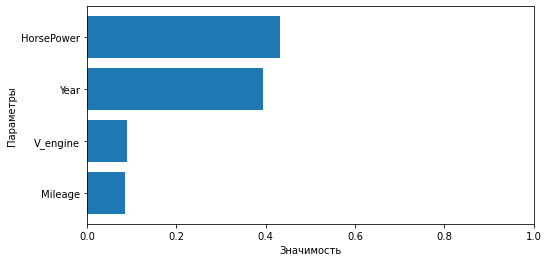

In [16]:
feature_importance_plotter_N(model, num_columns)

#### Метрики базовой модели:

In [17]:
print(f"r2 на тренировочной выборке: {r2_score(y_train, model.predict(X_train_num)):.4f}")
print(f"r2 на валидационной выборке: {r2_score(y_test, model.predict(X_test_num)):.4f}")

print(f"mse на тренировочной выборке: {mse(y_train, model.predict(X_train_num)):.4f}")
print(f"mse на валидационной выборке: {mse(y_test, model.predict(X_test_num)):.4f}")

print(f"rmse на тренировочной выборке: {mse(y_train, model.predict(X_train_num), squared=False):.4f}")
print(f"rmse на валидационной выборке: {mse(y_test, model.predict(X_test_num), squared=False):.4f}")

r2 на тренировочной выборке: 0.8883
r2 на валидационной выборке: 0.7924
mse на тренировочной выборке: 328618135407.5225
mse на валидационной выборке: 601945706494.9629
rmse на тренировочной выборке: 573252.2441
rmse на валидационной выборке: 775851.6008


#### Визуализация ошибок

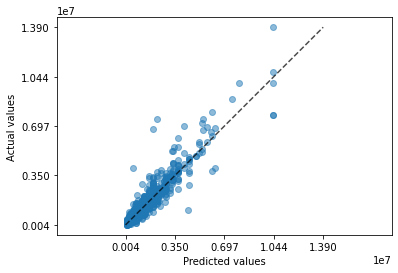

In [18]:
PredictionErrorDisplay.from_predictions(
    y_test,
    model.predict(X_test_num),
    kind="actual_vs_predicted",
    scatter_kwargs={"alpha": 0.5},
);

#### Визуализация дерева решений
Приведем подробные иллюстрации только для базовой модели для нагладности. Для остальных моделей только важные графики.

In [19]:
viz_reg_base = dtreeviz.model(model,
               X_train_num, y_train,
               target_name='Price',
               feature_names=num_columns)

In [20]:
viz_reg_base.view(fancy=False)

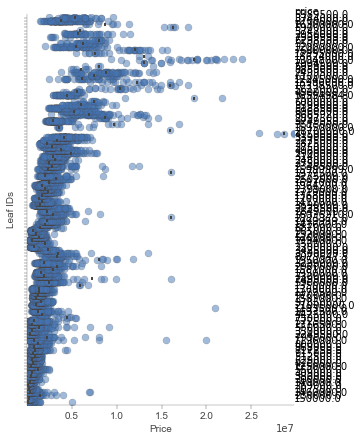

In [21]:
# Средняя цена на листьях
viz_reg_base.rtree_leaf_distributions()

In [22]:
# Предсказание для отдельного объекта
viz_reg_base.view(show_just_path=True, x = np.array(X_train_num.iloc[0]))

In [23]:
# Путь для предсказания
print(viz_reg_base.explain_prediction_path(np.array(X_train_num.iloc[0])))

0.5 <= Year 
0.04 <= Mileage  < 0.09
-0.36 <= V_engine  < -0.09
0.05 <= HorsePower  < 0.53



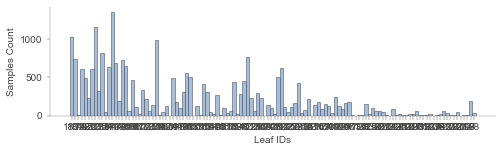

In [24]:
# Распределение по листам
viz_reg_base.leaf_sizes(figsize=(8,2))

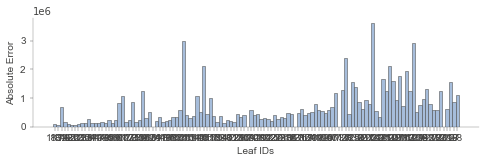

In [25]:
# Ошибка для листов
viz_reg_base.leaf_purity(figsize=(8,2))

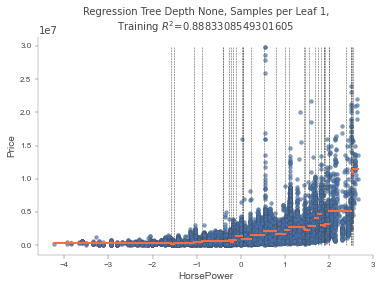

In [26]:
viz_reg_base.rtree_feature_space(features=['HorsePower'])

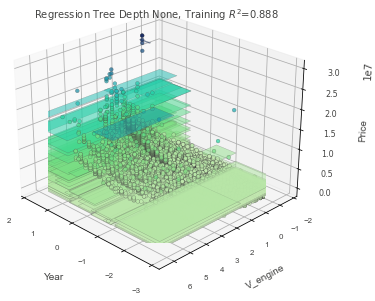

In [27]:
# 3D График
viz_reg_base.rtree_feature_space3D(features=['Year','V_engine'],
                                 fontsize=10,
                                 elev=25, azim=135,
                                 show={'splits', 'title'},
                                 colors={'tessellation_alpha': .5})

**Предварительные выводы (базовая модель):**
1. Погрешность предсказания цены, используя лишь 4 числовых признаков сразу показывает хорошие результаты и можно использовать для предсказаний;
2. Имеется буквально несколько выбросов ошибок в "больших" ценах, что лучше чем в аналогичной базовой линейной модели.
3. Метрика R2 на валидационной выборке 0.7924, что намного лучше чем у базовой [линейной модели из I семестра](https://apps.skillfactory.ru/learning/course/course-v1:Skillfactory+URFUML2023+SEP2023/block-v1:Skillfactory+URFUML2023+SEP2023+type@sequential+block@d2116c46b42747f28fe973e78452d838/block-v1:Skillfactory+URFUML2023+SEP2023+type@vertical+block@284df12c828d4c6cafeb376d46275c4b?homework=4253) 0.5018.
4. Дерево решений выбрало "Мощность" и "Год выпуска" как наиболее значимые признаки. Линейная модель приоритет отдавала "Пробегу". 
5. Модель не обнулила ни один признак и все числовые признаки значимые, но в разной степени.


### 4.2 Оценим влияние предварительной обработки целевой переменной

In [28]:
model_transformed = TransformedTargetRegressor(regressor=DecisionTreeRegressor(max_leaf_nodes=120, min_samples_split=5, criterion = 'absolute_error', random_state=42), transformer=PowerTransformer())
model_transformed.fit(X_train_num, y_train)

TransformedTargetRegressor(regressor=DecisionTreeRegressor(criterion='absolute_error',
                                                           max_leaf_nodes=120,
                                                           min_samples_split=5,
                                                           random_state=42),
                           transformer=PowerTransformer())

#### Нарисуем значимость признаков

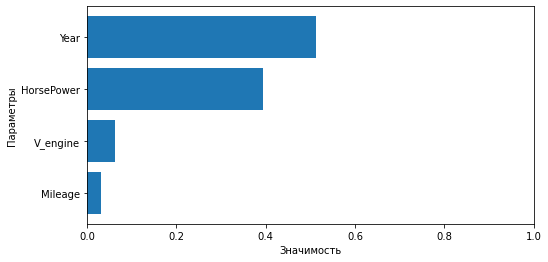

In [29]:
feature_importance_plotter_N(model_transformed.regressor_, num_columns)

#### Метрики модели:

In [30]:
print(f"r2 на тренировочной выборке: {r2_score(y_train, model_transformed.predict(X_train_num)):.4f}")
print(f"r2 на валидационной выборке: {r2_score(y_test, model_transformed.predict(X_test_num)):.4f}")

print(f"mse на тренировочной выборке: {mse(y_train, model_transformed.predict(X_train_num)):.4f}")
print(f"mse на валидационной выборке: {mse(y_test, model_transformed.predict(X_test_num)):.4f}")

print(f"rmse на тренировочной выборке: {mse(y_train, model_transformed.predict(X_train_num), squared=False):.4f}")
print(f"rmse на валидационной выборке: {mse(y_test, model_transformed.predict(X_test_num), squared=False):.4f}")

r2 на тренировочной выборке: 0.8092
r2 на валидационной выборке: 0.7899
mse на тренировочной выборке: 561449218945.3696
mse на валидационной выборке: 609176646049.5482
rmse на тренировочной выборке: 749299.1518
rmse на валидационной выборке: 780497.6913


#### Визуализация ошибок

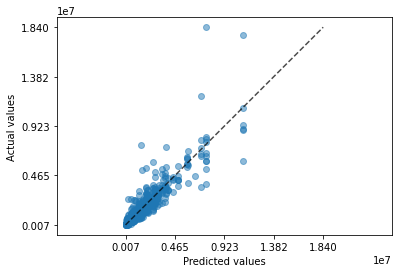

In [31]:
PredictionErrorDisplay.from_predictions(
    y_test,
    model_transformed.predict(X_test_num),
    kind="actual_vs_predicted",
    scatter_kwargs={"alpha": 0.5},
);

#### Визуализация дерева решений

In [32]:
viz_reg_trans = dtreeviz.model(model_transformed.regressor_,
               X_train_num, y_train,
               target_name='Price',
               feature_names=num_columns)

In [33]:
# Путь для предсказания
print(viz_reg_trans.explain_prediction_path(np.array(X_train_num.iloc[0])))

0.5 <= Year  < 0.87
0.05 <= Mileage 
V_engine < 0.4
0.08 <= HorsePower  < 0.53



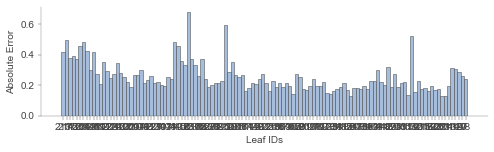

In [34]:
# Ошибка для листов
viz_reg_trans.leaf_purity(figsize=(8, 2))

**Выводы на базовую модель с предобработанным таргетом**
1. Предварительная обработка целевой переменной не улучшила качество модели, а даже слегла ухудшила его (упало с 0.7924 до 0.7899). Это связано с особенностями действия деревянной модели - для них закон распределения не сильно важен, т.к. разбиваются ветки по критерию информативности (энтропии).
2. Из-за пункта (1) далее в следующих моделях применяться преобразование целевой переменной не будет.
3. Поэтому остались примерно такие же редкие ошибки в "больших" ценах.
4. Остались прежними и с такими же коэффициентами значимые признаки. Наиболее значимые - это "Мощность" и "Год выпуска" с коэффициентами 0.5 и 0.4 соответственно. 


### 4.3 Оценка влияния категориальных признаков

In [35]:
model_categorial = DecisionTreeRegressor(max_leaf_nodes=120, min_samples_split=5, criterion = 'absolute_error', random_state=42)
model_categorial.fit(X_train, y_train) 

DecisionTreeRegressor(criterion='absolute_error', max_leaf_nodes=120,
                      min_samples_split=5, random_state=42)

#### Нарисуем значимость признаков

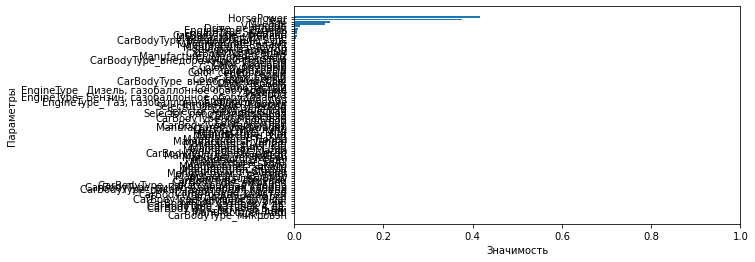

In [36]:
feature_importance_plotter_N(model_categorial, list(X_train.columns))

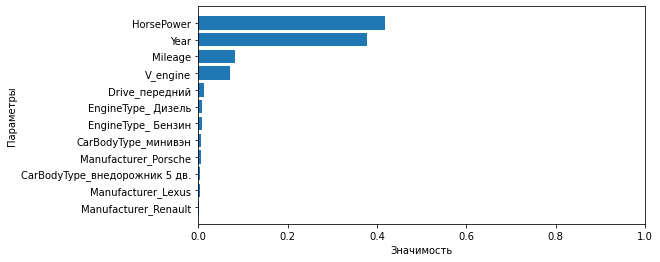

In [37]:
# Покажем лишь первые 12 значимых признаков для наглядности.
feature_importance_plotter_N(model_categorial, list(X_train.columns), N=12)

#### Метрики модели:

In [38]:
print(f"r2 на тренировочной выборке: {r2_score(y_train, model_categorial.predict(X_train)):.4f}")
print(f"r2 на валидационной выборке: {r2_score(y_test, model_categorial.predict(X_test)):.4f}")

print(f"mse на тренировочной выборке: {mse(y_train, model_categorial.predict(X_train)):.4f}")
print(f"mse на валидационной выборке: {mse(y_test, model_categorial.predict(X_test)):.4f}")

print(f"rmse на тренировочной выборке: {mse(y_train, model_categorial.predict(X_train), squared=False):.4f}")
print(f"rmse на валидационной выборке: {mse(y_test, model_categorial.predict(X_test), squared=False):.4f}")

r2 на тренировочной выборке: 0.8961
r2 на валидационной выборке: 0.8025
mse на тренировочной выборке: 305749762137.5240
mse на валидационной выборке: 572429343973.8245
rmse на тренировочной выборке: 552946.4370
rmse на валидационной выборке: 756590.6053


#### Визуализация ошибок

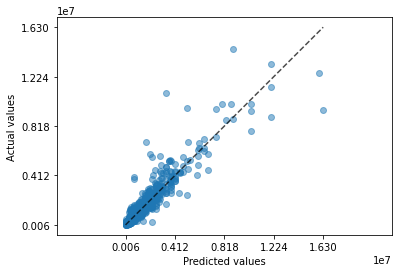

In [39]:
PredictionErrorDisplay.from_predictions(
    y_test,
    model_categorial.predict(X_test),
    kind="actual_vs_predicted",
    scatter_kwargs={"alpha": 0.5},
);

#### Визуализация дерева решений

In [40]:
viz_reg_categorial = dtreeviz.model(model_categorial,
               X_train, y_train,
               target_name='Price',
               feature_names=list(X_train.columns))

In [41]:
# Путь для предсказания
print(viz_reg_categorial.explain_prediction_path(np.array(X_train.iloc[0])))

0.04 <= Mileage  < 0.09
0.5 <= Year 
0.08 <= HorsePower  < 0.53
EngineType_ Дизель < 0.5
Drive_передний < 0.5



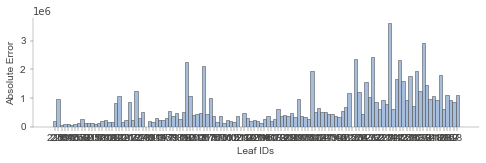

In [42]:
# Ошибка для листов
viz_reg_categorial.leaf_purity(figsize=(8, 2))

**Выводы на модель с категориальными признаками:**
1. Добавление категориальрных признаков улучшило качество модели, но слегла. Метрика R2 выросла с 0.7924 до 0.8025;
2. Всё также имеются выбросы в ошибках для "больших" цен.
3. Из всех 86 признаков, модель значимыми считает 11 и то, новые категориальные признаки получили существенно низкий коэффициент значимости по сравнению с числовыми признаками. В этом заметное отличие от линейной модели, которая существенно улучшила результат добавлением категориальных признаков с логическим объяснением (см. [Домашнее задание №2 из I семестра МОМО](https://apps.skillfactory.ru/learning/course/course-v1:Skillfactory+URFUML2023+SEP2023/block-v1:Skillfactory+URFUML2023+SEP2023+type@sequential+block@d2116c46b42747f28fe973e78452d838/block-v1:Skillfactory+URFUML2023+SEP2023+type@vertical+block@284df12c828d4c6cafeb376d46275c4b?homework=4253))


### 4.4 Оценим влияние добавления полиномиальных признаков

In [43]:
# Создаем полиномиальный трансформер и преобразовываем данные
poly = PolynomialFeatures(2)
X_train_poly = poly.fit_transform(X_train_num)
X_test_poly = poly.transform(X_test_num)

In [44]:
# размерность полученного массива полиномиальный признаков
X_train_poly.shape

(24704, 15)

In [45]:
#  выделим датафрейм категориальных признаков для последующего объединения
X_train_cat = X_train.drop(columns = num_columns)

In [46]:
# размерность категориального массива
X_train_cat.shape

(24704, 82)

In [47]:
# преобразовываем в датафрейм и объединяем с датафреймом категориальных признаков
X_train_poly = pd.DataFrame(X_train_poly, index=X_train_cat.index)
X_train_w_poly = X_train_poly.merge(X_train_cat, how='inner', on=X_train_cat.index)

In [48]:
# Удалим получившуюсь индексную колонку
X_train_w_poly = X_train_w_poly.drop(columns = 'key_0')

In [49]:
# проверим размерность объединенного массива
X_train_w_poly.shape

(24704, 97)

In [50]:
# посмотрим на получившийся массив
X_train_w_poly.head()

,0,1,2,3,4,5,6,7,8,9,...,Manufacturer_Nissan,Manufacturer_Opel,Manufacturer_Porsche,Manufacturer_Renault,Manufacturer_SEAT,Manufacturer_Skoda,Manufacturer_Subaru,Manufacturer_Suzuki,Manufacturer_Toyota,Manufacturer_Volkswagen
0,1.0,0.779634,0.057999,-0.250464,0.430558,0.607829,0.045218,-0.195271,0.335678,0.003364,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,1.0,0.970140,0.155999,2.008956,1.890544,0.941171,0.151341,1.948967,1.834092,0.024336,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.593399,0.105999,0.825450,1.501889,0.352123,0.062900,0.489822,0.891220,0.011236,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,-1.876185,0.111110,-0.465647,-0.001748,3.520072,-0.208463,0.873641,0.003280,0.012345,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,1.0,-0.598286,0.167999,-0.788421,-1.043041,0.357946,-0.100511,0.471701,0.624036,0.028224,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [51]:
# сделаем тоже самое для тестовой выборки X_test
X_test_cat = X_test.drop(columns = num_columns)
X_test_poly = pd.DataFrame(X_test_poly, index=X_test_cat.index)
X_test_w_poly = X_test_poly.merge(X_test_cat, how='inner', on=X_test_cat.index)
X_test_w_poly = X_test_w_poly.drop(columns = 'key_0')

In [52]:
# посмотрим на получившийся массив тестовой выборки
X_test_w_poly.head()

,0,1,2,3,4,5,6,7,8,9,...,Manufacturer_Nissan,Manufacturer_Opel,Manufacturer_Porsche,Manufacturer_Renault,Manufacturer_SEAT,Manufacturer_Skoda,Manufacturer_Subaru,Manufacturer_Suzuki,Manufacturer_Toyota,Manufacturer_Volkswagen
0,1.0,0.059393,0.234999,-0.680830,-0.651616,0.003527,0.013957,-0.040436,-0.038701,0.055225,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,-0.905346,0.119999,3.300053,1.373012,0.819651,-0.108641,-2.987688,-1.243050,0.014400,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.233369,0.152999,-0.250464,0.866587,0.054461,0.035705,-0.058451,0.202235,0.023409,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.411342,0.095027,-0.250464,-0.068945,0.169202,0.039089,-0.103026,-0.028360,0.009030,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1.0,0.233369,0.209999,-0.250464,-0.001748,0.054461,0.049007,-0.058451,-0.000408,0.044100,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [53]:
# необходимо для выполнения условия модели, чтобы названия всех признаков были строки
X_train_w_poly.columns = X_train_w_poly.columns.astype(str)
X_test_w_poly.columns = X_test_w_poly.columns.astype(str)

#### Создаем модель

In [54]:
# model_poly = TransformedTargetRegressor(regressor=DecisionTreeRegressor(max_leaf_nodes=250, min_samples_split=5, criterion = 'squared_error'), transformer=PowerTransformer())
model_poly = DecisionTreeRegressor(max_leaf_nodes=120, min_samples_split=5, criterion = 'absolute_error', random_state=42)
model_poly.fit(X_train_w_poly, y_train) 

DecisionTreeRegressor(criterion='absolute_error', max_leaf_nodes=120,
                      min_samples_split=5, random_state=42)

#### Нарисуем значимость признаков

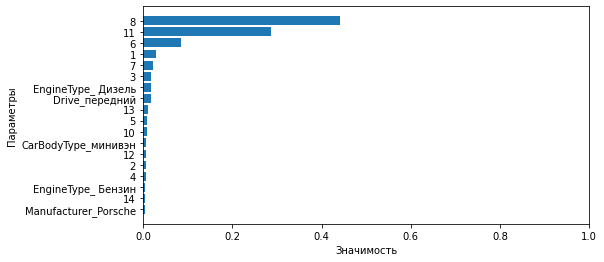

In [55]:
feature_importance_plotter_N(model_poly, list(X_train_w_poly.columns), N=18)

#### Метрики модели:

In [56]:
print(f"r2 на тренировочной выборке: {r2_score(y_train, model_poly.predict(X_train_w_poly)):.4f}")
print(f"r2 на валидационной выборке: {r2_score(y_test, model_poly.predict(X_test_w_poly)):.4f}")

print(f"mse на тренировочной выборке: {mse(y_train, model_poly.predict(X_train_w_poly)):.4f}")
print(f"mse на валидационной выборке: {mse(y_test, model_poly.predict(X_test_w_poly)):.4f}")

print(f"rmse на тренировочной выборке: {mse(y_train, model_poly.predict(X_train_w_poly), squared=False):.4f}")
print(f"rmse на валидационной выборке: {mse(y_test, model_poly.predict(X_test_w_poly), squared=False):.4f}")

r2 на тренировочной выборке: 0.8945
r2 на валидационной выборке: 0.8127
mse на тренировочной выборке: 310432566039.9341
mse на валидационной выборке: 543025013143.7010
rmse на тренировочной выборке: 557164.7566
rmse на валидационной выборке: 736902.3091


#### Визуализация ошибок

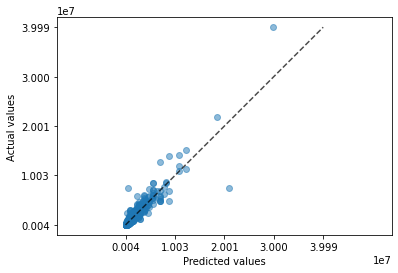

In [57]:
PredictionErrorDisplay.from_predictions(
    y_test,
    model_poly.predict(X_test_w_poly),
    kind="actual_vs_predicted",
    scatter_kwargs={"alpha": 0.5},
);

#### Визуализация дерева решений

In [58]:
viz_reg_poly = dtreeviz.model(model_poly,
               X_train_w_poly, y_train,
               target_name='Price',
               feature_names=list(X_train_w_poly.columns))

In [59]:
# Путь для предсказания
print(viz_reg_poly.explain_prediction_path(np.array(X_train_w_poly.iloc[0])))

2 < 0.1
-0.04 <= 6 
7 < 0.57
0.22 <= 8  < 0.37
-0.01 <= 11 
EngineType_ Дизель < 0.5
Drive_передний < 0.5



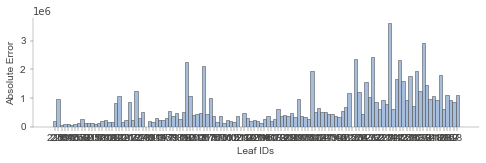

In [60]:
# Ошибка для листов
viz_reg_categorial.leaf_purity(figsize=(8, 2))

**Выводы на модель с полиномиальными признаками:**



**Выводы по добавлению полиномиальных признаков:**
1. Добавление полиномиальных признаков еще немного улучшила качество модели. Метрика R2 выросла с 0.8025 до 0.8127. 
2. Т.к. мы увеличили данные синтезировав новые нелинейные признаки, модель смогла использовать их в обучении
2. В больших ценах осталась буквально 2-3 выброса;
3. Данные полиномиальные признаки сложно интерпретировать. Совсем не понятно, какой признак за что отвечает и как влияет на качество модели;
4. Модель выделила с учётом полиномиальных признаков - 18 значимых признаков (остальные 0). Из них только 5 категориальных с небольшими коэффициентами, остальные это производные от числовых признаков.
5. Наилучший результат в линейной модели был 0.8004 ((см. [Домашнее задание №2 из I семестра МОМО](https://apps.skillfactory.ru/learning/course/course-v1:Skillfactory+URFUML2023+SEP2023/block-v1:Skillfactory+URFUML2023+SEP2023+type@sequential+block@d2116c46b42747f28fe973e78452d838/block-v1:Skillfactory+URFUML2023+SEP2023+type@vertical+block@284df12c828d4c6cafeb376d46275c4b?homework=4253)), что говорит о преимуществе деревянной модели в данной задачи.
